<a href="https://colab.research.google.com/github/Bhanu-812/Bhanu-812/blob/main/FR.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [3]:
# !pip install insightface
# !pip install onnxruntime

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 439.5/439.5 kB 9.4 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 15.9/15.9 MB 44.1 MB/s eta 0:00:00
  Created wheel for insightface: filename=insightface-0.7.3-cp310-cp310-linux_x86_64.whl size=1055336 sha256=be3198c19670c5c0f7af7050ca00b1085facf2d1c75c048908284108d27641f2
  Stored in directory: /root/.cache/pip/wheels/e3/d0/80/e3773fb8b6d1cca87ea1d33d9b1f20a223a6493c896da249b5
Successfully built insightface
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.8/6.8 MB 53.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.0/46.0 kB 5.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 86.8/86.8 kB 9.9 MB/s eta 0:00:00


In [4]:
import cv2
import numpy as np
import insightface
from insightface.app import FaceAnalysis
from insightface.data import get_image as ins_get_image

In [5]:
print('insightface', insightface.__version__)
print('numpy', np.__version__)

insightface 0.7.3
numpy 1.25.2


In [6]:
app = FaceAnalysis(name = 'buffalo_l')
app.prepare(ctx_id=0, det_size=(640, 640))

download_path: /root/.insightface/models/buffalo_l


100%|██████████| 281857/281857 [00:07<00:00, 35825.31KB/s]
/usr/local/lib/python3.10/dist-packages/onnxruntime/capi/onnxruntime_inference_collection.py:69: UserWarning: Specified provider 'CUDAExecutionProvider' is not in available provider names.Available providers: 'AzureExecutionProvider, CPUExecutionProvider'
  warnings.warn(


Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: /root/.insightface/models/buffalo_l/1k3d68.onnx landmark_3d_68 ['None', 3, 192, 192] 0.0 1.0
Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: /root/.insightface/models/buffalo_l/2d106det.onnx landmark_2d_106 ['None', 3, 192, 192] 0.0 1.0
Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: /root/.insightface/models/buffalo_l/det_10g.onnx detection [1, 3, '?', '?'] 127.5 128.0
Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: /root/.insightface/models/buffalo_l/genderage.onnx genderage ['None', 3, 96, 96] 0.0 1.0
Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: /root/.insightface/models/buffalo_l/w600k_r50.onnx recognition ['None', 3, 112, 112] 127.5 127.5
set det-size: (640, 640)


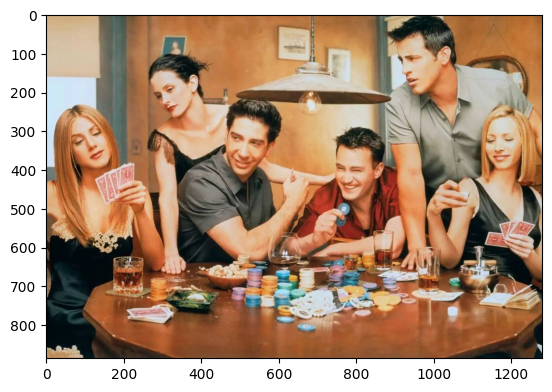

In [7]:
import matplotlib.pyplot as plt
img = ins_get_image('t1')
plt.imshow(img[:,:,::-1])
plt.show()

In [8]:
faces = app.get(img)
faces[0].keys()
# dict_keys(['bbox', 'kps', 'det_score', 'landmark_3d_68', 'pose', 'landmark_2d_106', 'gender', 'age', 'embedding'])


/usr/local/lib/python3.10/dist-packages/insightface/utils/transform.py:68: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  P = np.linalg.lstsq(X_homo, Y)[0].T # Affine matrix. 3 x 4


dict_keys(['bbox', 'kps', 'det_score', 'landmark_3d_68', 'pose', 'landmark_2d_106', 'gender', 'age', 'embedding'])

In [9]:
print(faces)

[{'bbox': array([466.0821 , 268.6164 , 573.58923, 415.5331 ], dtype=float32), 'kps': array([[491.85046, 321.8314 ],
       [541.85266, 332.11188],
       [507.67114, 366.41312],
       [485.91965, 369.691  ],
       [533.74945, 378.3811 ]], dtype=float32), 'det_score': 0.9196533, 'landmark_3d_68': array([[ 4.69443695e+02,  2.96989471e+02,  7.57227936e+01],
       [ 4.68134155e+02,  3.12719116e+02,  7.92197113e+01],
       [ 4.66747955e+02,  3.28960175e+02,  8.15076981e+01],
       [ 4.66053284e+02,  3.45325989e+02,  8.09227753e+01],
       [ 4.66922272e+02,  3.62514740e+02,  7.33340378e+01],
       [ 4.71003143e+02,  3.77187256e+02,  6.58566513e+01],
       [ 4.75966827e+02,  3.90255829e+02,  5.81926956e+01],
       [ 4.82846588e+02,  4.03262604e+02,  4.71076164e+01],
       [ 4.97964294e+02,  4.14659698e+02,  4.25628624e+01],
       [ 5.16660706e+02,  4.12995361e+02,  4.67766647e+01],
       [ 5.30892578e+02,  4.03689392e+02,  5.69011192e+01],
       [ 5.43086670e+02,  3.93266632e+02,

In [10]:
len(faces)
# 6

6

In [11]:
print('bbox:')
print(faces[3].bbox)
print('kps:')
print(faces[3].kps)
print('det_score')
print(faces[3].det_score)


bbox:
[1132.9001   269.0319  1227.1696   397.58008]
kps:
[[1148.8239   326.0181 ]
 [1193.2102   323.8155 ]
 [1166.1467   350.2246 ]
 [1154.2952   365.36026]
 [1196.0679   363.4772 ]]
det_score
0.8817977


In [12]:
print('landmark_3d_68')
print(faces[3].landmark_3d_68)
print('pose')
print(faces[3].pose)
print('landmark_2d_106', len(faces[3].landmark_2d_106))
print(faces[3].landmark_2d_106)

landmark_3d_68
[[ 1.13596460e+03  3.25861084e+02  8.06819992e+01]
 [ 1.13871802e+03  3.39363678e+02  7.84335251e+01]
 [ 1.14138989e+03  3.53073792e+02  7.51390457e+01]
 [ 1.14426294e+03  3.65863007e+02  6.92979736e+01]
 [ 1.14703333e+03  3.77082581e+02  5.76943207e+01]
 [ 1.15211572e+03  3.85102051e+02  4.75075264e+01]
 [ 1.15742761e+03  3.91317383e+02  3.81541634e+01]
 [ 1.16328540e+03  3.96352020e+02  2.57996159e+01]
 [ 1.17637341e+03  3.99702728e+02  1.56364803e+01]
 [ 1.19250598e+03  3.94728302e+02  1.73088589e+01]
 [ 1.20440552e+03  3.87437805e+02  2.68381138e+01]
 [ 1.21405042e+03  3.78982941e+02  3.50256653e+01]
 [ 1.22101868e+03  3.70586792e+02  4.37927170e+01]
 [ 1.22531580e+03  3.61392578e+02  5.15939980e+01]
 [ 1.22864771e+03  3.48081024e+02  5.70192642e+01]
 [ 1.22992554e+03  3.32737305e+02  5.71828423e+01]
 [ 1.23170203e+03  3.19745819e+02  5.69493332e+01]
 [ 1.13535767e+03  3.15926636e+02  3.59998817e+01]
 [ 1.13818152e+03  3.11940826e+02  2.87871437e+01]
 [ 1.14303271e+0

In [13]:
print('Gender')
print(faces[3].gender)
print('age')
print(faces[3].age)
print('embedding', len(faces[3].embedding))
print(faces[3].embedding)

Gender
0
age
26
embedding 512
[-2.48101398e-01  1.82706058e+00  5.32611787e-01 -3.65585893e-01
 -1.86459243e-01  1.32419622e+00 -2.08172917e+00 -7.33793616e-01
  1.12132621e+00  1.65558144e-01  9.03139472e-01 -4.02512401e-01
 -1.41736552e-01 -1.14960945e+00 -6.50266290e-01  9.96219814e-02
  2.60111004e-01  1.52751818e-01 -3.42236459e-01 -9.67204094e-01
 -9.61673737e-01 -1.21419743e-01 -1.14037657e+00  4.31521714e-01
 -2.27255180e-01  2.63127208e-01 -1.39541578e+00  8.58379900e-03
  1.97234941e+00  1.69590831e-01 -8.04571450e-01 -1.09090757e+00
 -7.44231939e-02  1.36237353e-01  2.80050784e-02 -2.86113322e-01
 -8.07843149e-01  2.44705343e+00 -5.34361452e-02 -1.31247854e+00
 -4.46441948e-01 -2.36643687e-01 -2.21309280e+00 -8.78663659e-01
  3.09519506e+00 -1.02775598e+00 -1.85030818e+00  5.60040623e-02
  3.28426242e-01 -2.79789019e+00 -5.76730251e-01 -8.85407627e-01
 -8.03674608e-02  1.22805727e+00  9.92399633e-01  3.00816149e-01
  1.05933750e+00 -2.13146415e-02 -1.84740162e+00 -3.69965971

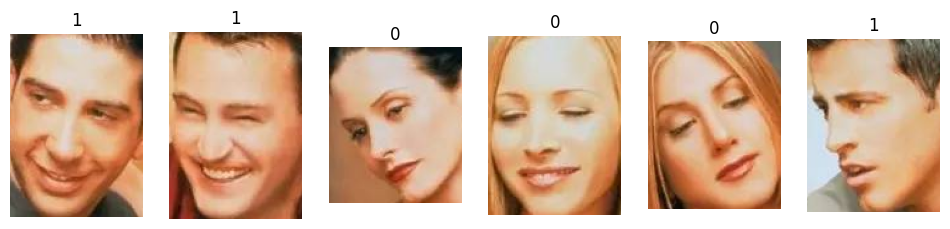

In [14]:
fig, axis = plt.subplots(1, 6, figsize = (12, 5))

for i, face in enumerate(faces):
    bbox = face['bbox']
    bbox = [int(b) for b in bbox]
    axis[i].imshow(img[bbox[1]:bbox[3], bbox[0]:bbox[2], ::-1])
    axis[i].axis('off')
    axis[i].set_title(face['gender'])
    # axis[i].set_title(face['age'])


In [15]:
faces[5].sex

'M'

In [16]:
import cv2
def draw(img, faces):
    dimg = img.copy()
    for i in range(len(faces)):
        face = faces[i]
        box = face.bbox
        color = (255, 0, 0)
        cv2.rectangle(dimg, (int(box[0]), int(box[1])), (int(box[2]), int(box[3])), color, 2)
        if face.kps is not None:
            kps = face.kps
            #print(landmark.shape)
            for l in range(kps.shape[0]):
                color = (0, 0, 255)
                if l == 0 or l == 3:
                    color = (0, 255, 0)
                cv2.circle(dimg, (int(kps[l][0]), int(kps[l][1])), 1, color,2)
        if face.gender is not None and face.age is not None:
            cv2.putText(dimg,'%s,%d'%(face.sex, face.age), (int(box[0]-1), int(box[1]-4)), cv2.FONT_HERSHEY_COMPLEX,0.7,(75,150,255),1)
    return dimg

rimg = draw(img, faces)
cv2.imwrite("./output.jpg", rimg)

True

In [17]:
from PIL import Image

# Open the image file


# Convert the image data to a numpy array
# b1 = np.array(b1imag)
# b2 = np.array(b2imag)
# p1 = np.array(p1imag)
# p2 = np.array(p2imag)
# t1 = np.array(t1imag)
# t2 = np.array(t2imag)
# pr1 = np.array(pr1imag)
# pr2 = np.array(pr2imag)

# plt.imshow(b1)
# plt.show()
# plt.imshow(b2)
# plt.show()
# plt.imshow(t1)
# plt.show()
# plt.imshow(t2)
# plt.show()

NameError: name 'b1imag' is not defined

In [ ]:
import numpy as np
from scipy.spatial.distance import cosine
from tabulate import tabulate

# Initialize an empty matrix for storing the cosine similarities
cosine_similarities = np.zeros((len(embeddings), len(embeddings)))

# Compute the cosine similarity for each pair of embeddings
for i in range(len(embeddings)):
    for j in range(len(embeddings)):
        cosine_similarities[i][j] = 1 - cosine(embeddings[i], embeddings[j])

# Tabulate the results
headers = ['t1', 't2', 'b1', 'b2', 'p1', 'p2', 'pr1', 'pr2']
table = tabulate(cosine_similarities, headers, floatfmt=".2f", showindex=headers)

print(table)


In [ ]:
embeddings = [app.get(t1)[0].embedding, app.get(t2)[0].embedding, app.get(b1)[0].embedding, app.get(b2)[0].embedding, app.get(p1)[0].embedding, app.get(p2)[0].embedding, app.get(pr1)[0].embedding, app.get(pr2)[0].embedding]


In [ ]:
f = app.get(imageData)
f[0].bbox

In [ ]:
plt.imshow(imageData[bbox[1]:bbox[3], bbox[0]:bbox[2]])

In [ ]:
import cv2
def draw(img, faces):
    dimg = img.copy()
    for i in range(len(faces)):
        face = faces[i]
        box = face.bbox
        color = (0, 0, 255)
        cv2.rectangle(dimg, (int(box[0]), int(box[1])), (int(box[2]), int(box[3])), color, 2)
        # if face.kps is not None:
        #     kps = face.kps.astype(np.int)
        #     #print(landmark.shape)
        #     for l in range(kps.shape[0]):
        #         color = (0, 0, 255)
        #         if l == 0 or l == 3:
        #             color = (0, 255, 0)
        #         cv2.circle(dimg, (kps[l][0], kps[l][1]), 1, color,
        #                     2)
        # if face.gender is not None and face.age is not None:
        #     cv2.putText(dimg,'%s,%d'%(face.sex,face.age), (box[0]-1, box[1]-4),cv2.FONT_HERSHEY_COMPLEX,0.7,(0,255,0),1)

    return dimg
# print(f[0].bbox[0])
# cv2.rectangle(imageData, (int(f[0].bbox[0]), int(f[0].bbox[1])), (int(f[0].bbox[2]), int(f[0].bbox[3])), (0, 0, 255), 2)
rimg = draw(img, faces)
cv2.imwrite("./t1_output.jpg", rimg)

In [ ]:
from PIL import Image

# Open the image file
img1 = Image.open('/content/20240427_145936~2.jpg')

# Convert the image data to a numpy array
image_data = np.array(img1)

# print(image_data)
plt.imshow(image_data)
plt.show()

# New Section

In [ ]:
faces1 = app.get(image_data)
len(faces1)

In [ ]:
faces1[0].bbox


In [ ]:
fig, axis = plt.subplots(1, 3, figsize = (12, 5))

for i, face in enumerate(faces1):
    bbox = face['bbox']
    bbox = [int(b) for b in bbox]
    axis[i].imshow(image_data[bbox[1]:bbox[3], bbox[0]:bbox[2]])
    axis[i].axis('off')

In [ ]:
# len(faces[1].embedding)
# faces[2].gender
print(faces[0].bbox)

In [ ]:
a = faces[2].embedding

In [ ]:
from PIL import Image

# Open the image file
img2 = Image.open('/content/20240427_210026~2.jpg')


image2_data = np.array(img2)

# print(image_data)
plt.imshow(image2_data)
plt.show()

In [ ]:
faces2 = app.get(image2_data)

In [ ]:
fig, axis = plt.subplots(1, 2, figsize = (12, 5))

for i, face in enumerate(faces2):
    bbox = face['bbox']
    bbox = [int(b) for b in bbox]
    axis[i].imshow(image2_data[bbox[1]:bbox[3], bbox[0]:bbox[2]])
    axis[i].axis('off')

In [ ]:
faces2[1].gender


In [ ]:
b = faces2[1].embedding

In [ ]:
import numpy as np

def cosine_similarity(A, B):
    dot_product = np.dot(A, B)
    norm_A = np.linalg.norm(A)
    norm_B = np.linalg.norm(B)
    return dot_product / (norm_A * norm_B)
print(cosine_similarity(a, b))

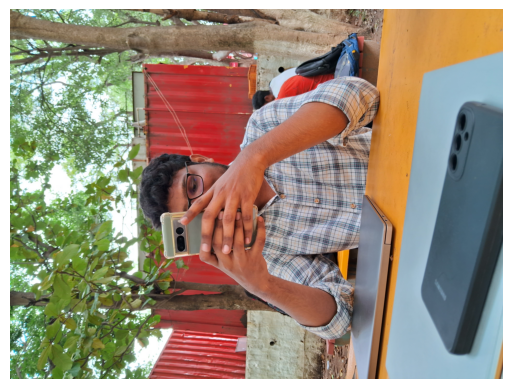

Similarity: 0.4295



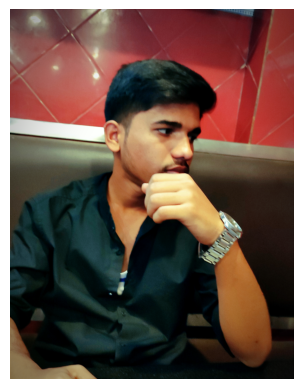

Similarity: 0.0459



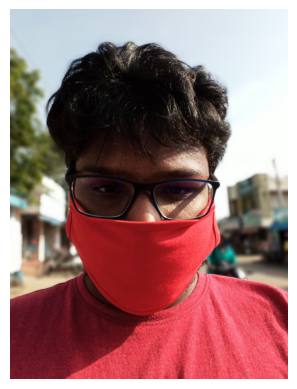

Similarity: 0.4011



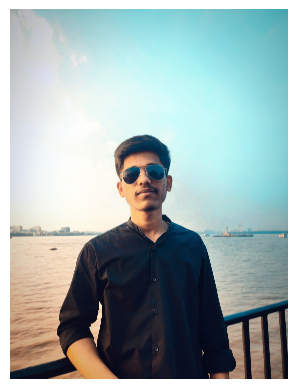

Similarity: 0.0126



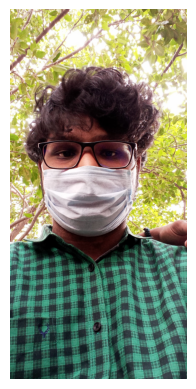

Similarity: 0.3220



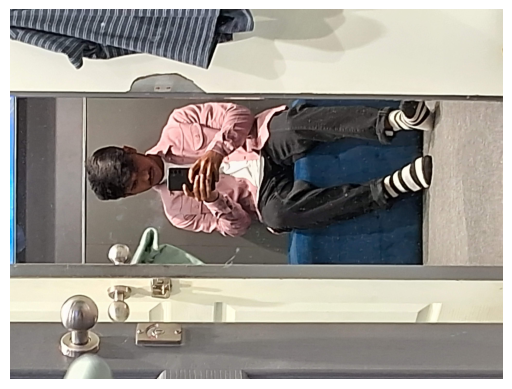

Similarity: 0.0831



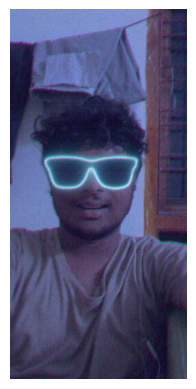

Similarity: 0.3854



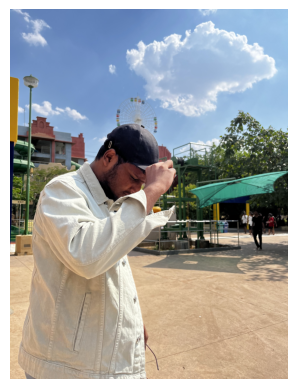

Similarity: 0.4669



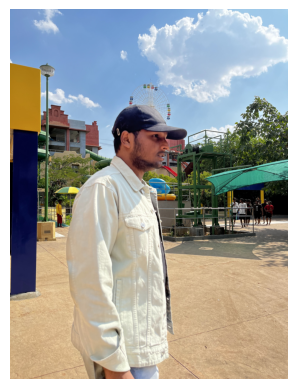

Similarity: 0.4539



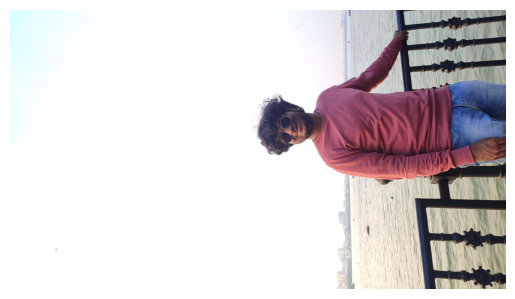

Similarity: 0.4748



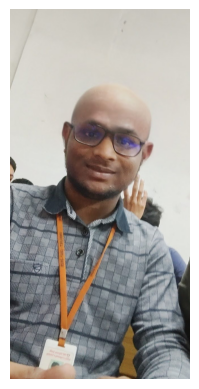

Similarity: 0.4184



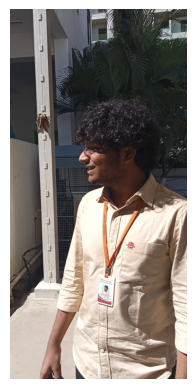

Similarity: 0.2406



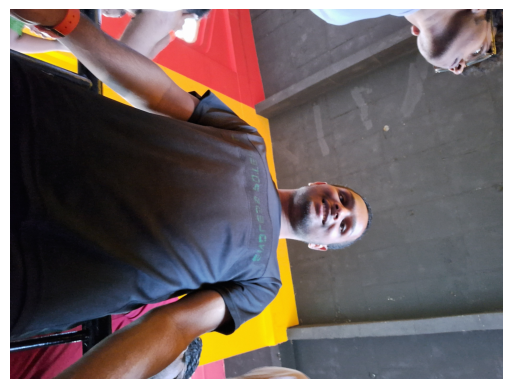

Similarity: 0.4497



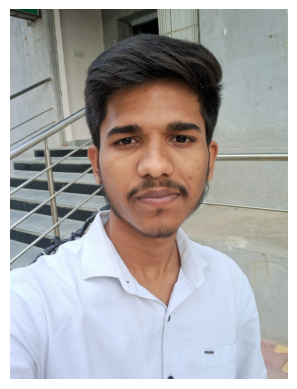

Similarity: 0.1104



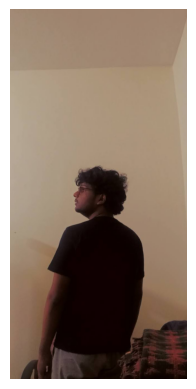

Similarity: 0.4591



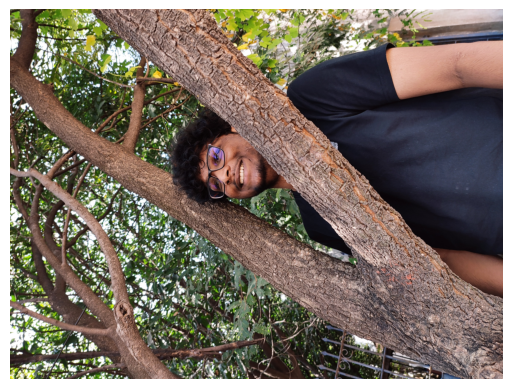

Similarity: 0.4953



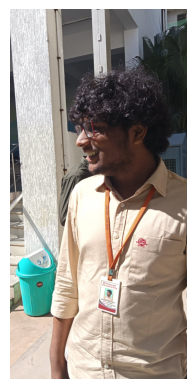

Similarity: 0.2668



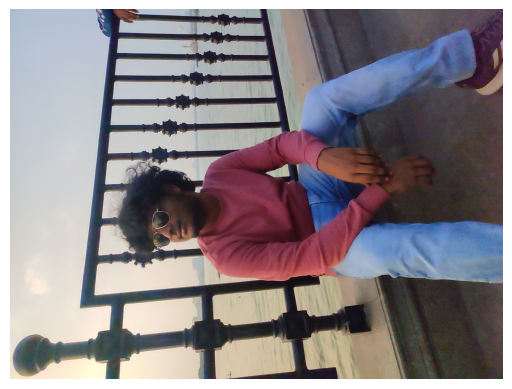

Similarity: 0.4298

Similarities for Tarun's images: [0.73136115, 0.54471916, 0.42951533, 0.04589165, 0.4011184, 0.012557347, 0.5116714, 0.51271343, 0.3220052, 0.08309035, 0.62129384, 0.99999994, 0.38541353, 0.4669208, 0.5322307, 0.53614736, 0.45389724, 0.6803761, 0.47476482, 0.41835985, 0.6110383, 0.24058616, 0.4497144, 0.110402286, 0.45912892, 0.49533564, 0.60253704, 0.51823795, 0.26684225, 0.53785306, 0.42976362]


In [28]:
import os
import cv2
from sklearn.metrics.pairwise import cosine_similarity
import warnings
warnings.filterwarnings('ignore')
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt

# Function to get the embedding of an image
def get_embedding(image_path):
    img = cv2.imread(image_path)
    faces = app.get(img)
    if len(faces) == 0:
        return None
    return faces[0].embedding

# Paths to the base images
base_image_tarun = '/content/TARUN_BASE.jpg'

# Get embeddings for the base images
base_embedding_tarun = get_embedding(base_image_tarun)

# Function to calculate cosine similarity
def calculate_similarity(embedding1, embedding2):
    if embedding1 is None or embedding2 is None:
        return None
    return cosine_similarity([embedding1], [embedding2])[0][0]

# Folder paths (adjust these paths based on your operating system)
folder_tarun = '/content/sample_data/Tarun'

# Check if the directories exist
if not os.path.exists(folder_tarun):
    raise FileNotFoundError(f"Directory not found: {folder_tarun}")

# Lists to store similarities
similarities_tarun = []

# Process Tarun's images
for filename in os.listdir(folder_tarun):
    if filename.endswith(".jpg") or filename.endswith(".jpeg"):
        image_path = os.path.join(folder_tarun, filename)
        embedding = get_embedding(image_path)
        similarity = calculate_similarity(base_embedding_tarun, embedding)
        if similarity is not None and similarity < 0.5:
            img2 = Image.open(image_path)
            # Convert the image data to a numpy array
            image2_data = np.array(img2)
            plt.imshow(image2_data)
            plt.axis('off')  # Hide axis
            plt.show()
            print(f"Similarity: {similarity:.4f}\n")
        similarities_tarun.append(similarity)

print("Similarities for Tarun's images:", similarities_tarun)


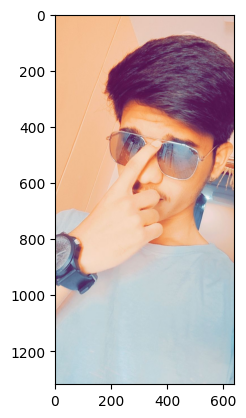

0.48793268



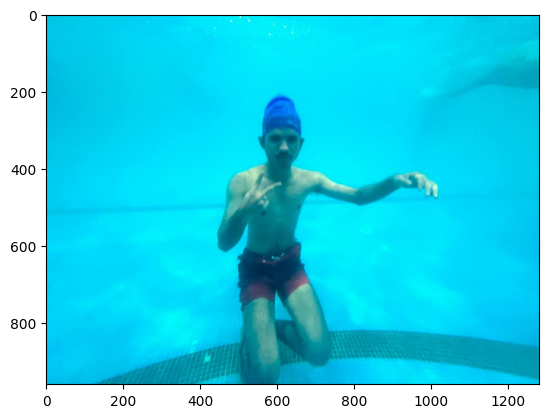

0.45357868



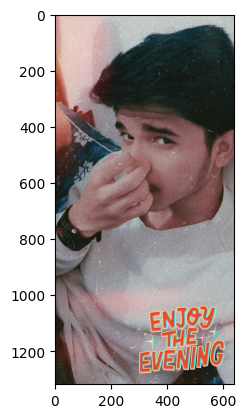

0.40906256

Similarities for bhanu's images: [0.67199636, 0.7106499, 0.699518, 0.7584301, 0.53778553, 0.6376567, 0.48793268, 0.5771502, 0.6922439, 0.708683, 0.6032877, 0.6148931, 0.55445945, 0.7628481, 0.6621667, 0.54831666, 0.45357868, 0.75267917, 0.7270175, 0.5839238, 0.63537204, 0.5969168, 0.60955316, 0.99999994, 0.7439214, 0.5913849, 0.6242157, 0.40906256]


In [29]:
import warnings
warnings.filterwarnings('ignore')
from PIL import Image


def get_embedding(image_path):
    img = cv2.imread(image_path)
    faces = app.get(img)
    if len(faces) == 0:
        return None
    return faces[0].embedding

base_image_bhanu = '/content/BHANU_BASE.jpg'


base_embedding_yhab = get_embedding(base_image_bhanu)

def calculate_similarity(embedding1, embedding2):
    if embedding1 is None or embedding2 is None:
        return None
    return cosine_similarity([embedding1], [embedding2])[0][0]

folder_yhab = "/content/sample_data/Bhanu"

if not os.path.exists(folder_yhab):
    raise FileNotFoundError(f"Directory not found: {folder_yhab}")

similarities_yhab = []
for filename in os.listdir(folder_yhab):
    if filename.endswith(".jpg") or filename.endswith(".jpeg"):
        image_path = os.path.join(folder_yhab, filename)
        embedding = get_embedding(image_path)
        similarity = calculate_similarity(base_embedding_yhab, embedding)
        if similarity is not None and similarity < 0.5:
          img2 = Image.open(image_path)
          # Convert the image data to a numpy array
          image2_data = np.array(img2)
          plt.imshow(image2_data)
          plt.show()
          print(similarity)
          print()
        similarities_yhab.append(similarity)

print("Similarities for bhanu's images:", similarities_yhab)

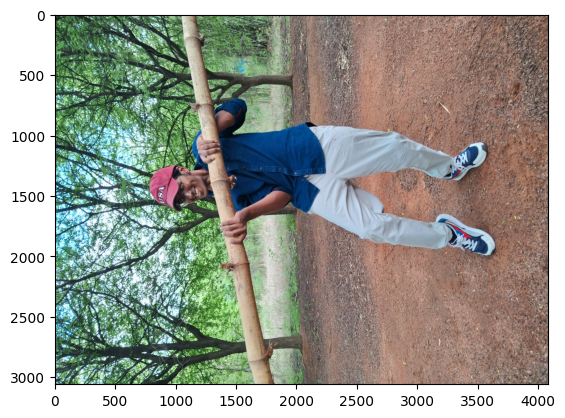

0.50197536



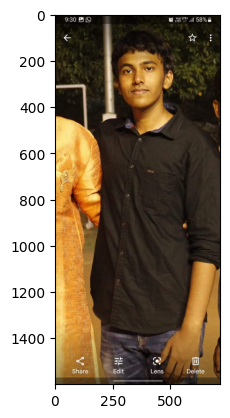

0.7244009



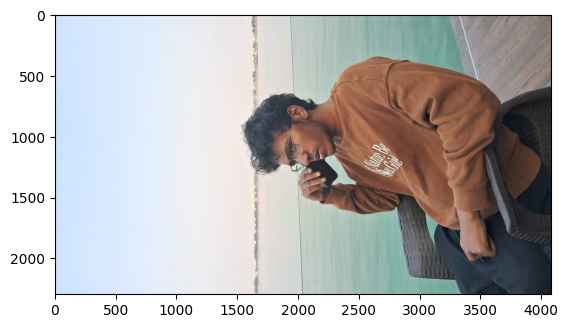

0.6630641



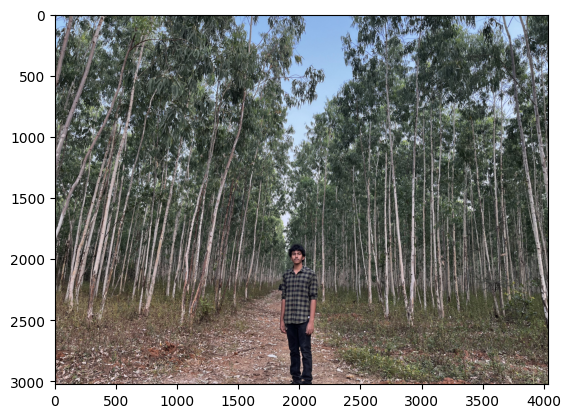

0.68350035



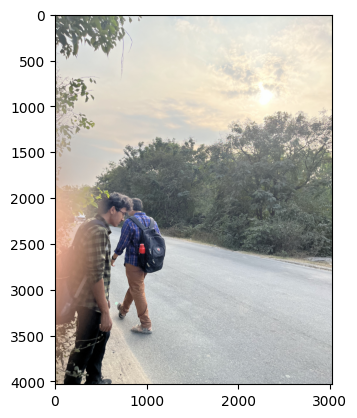

0.4075886



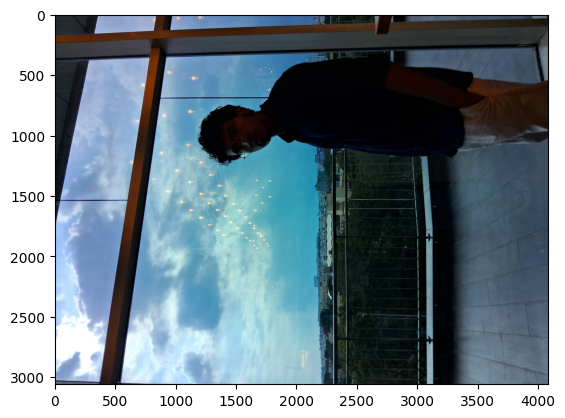

0.63806087



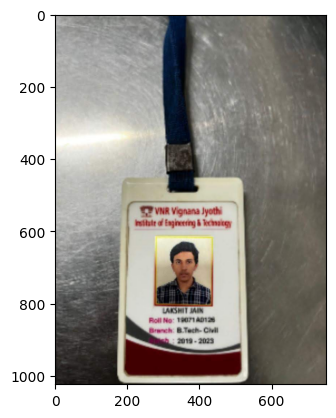

0.28381735



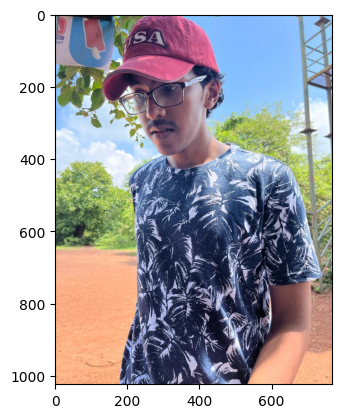

0.478532



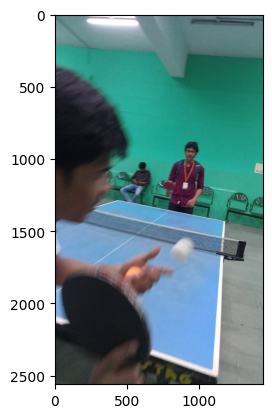

0.29591224



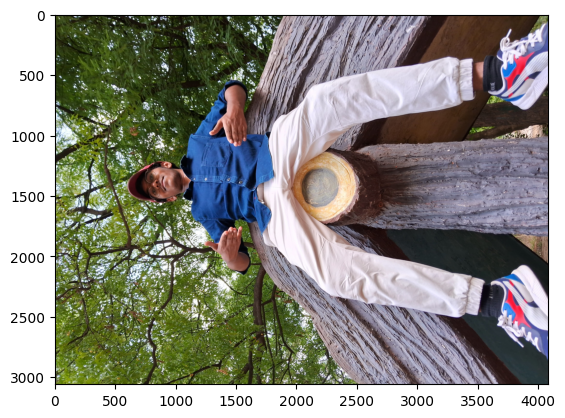

0.61052233



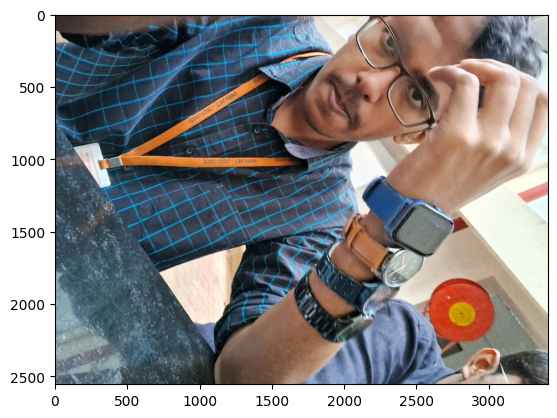

0.51401615



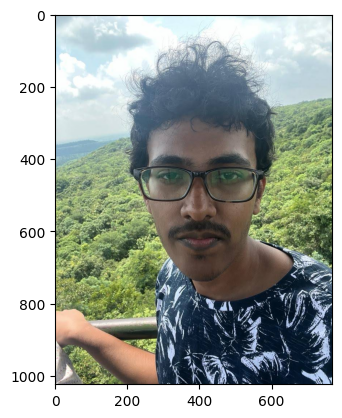

0.59037626



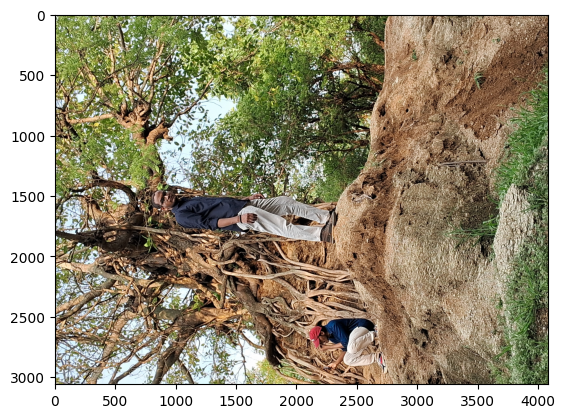

-0.042238906



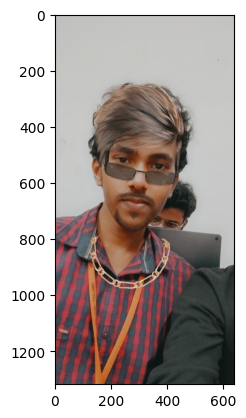

0.5682465



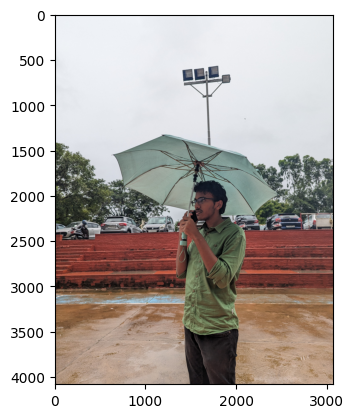

0.6275383



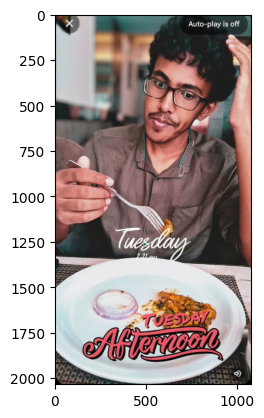

0.61365634



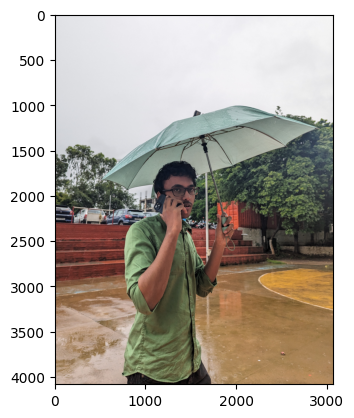

0.5100907



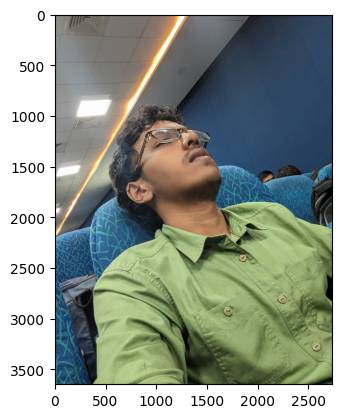

0.43498003



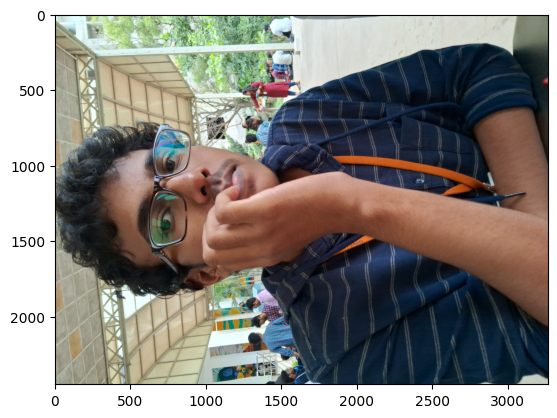

0.58328736



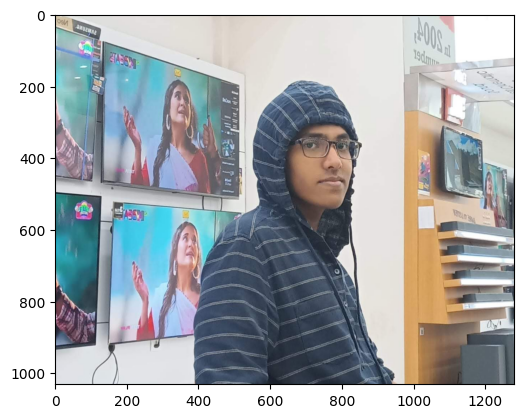

0.6282052



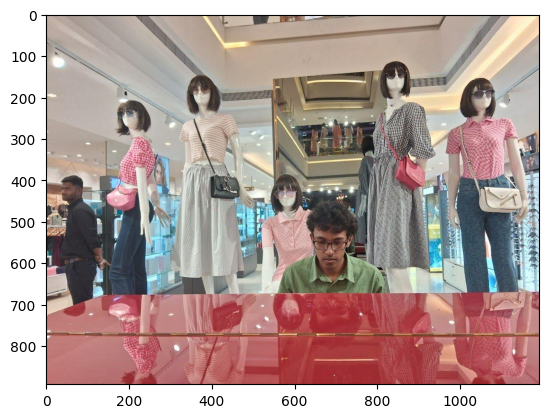

0.588706



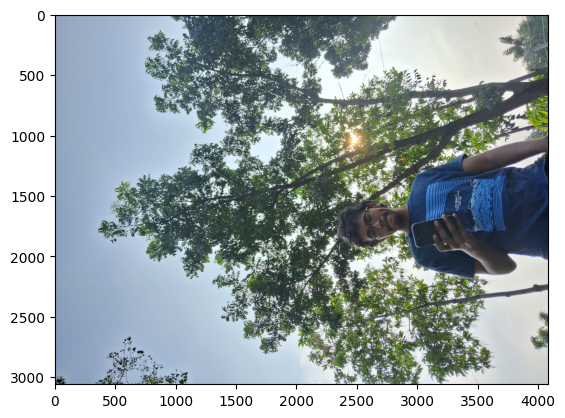

0.5727931

Similarities for nishant's images: [0.50197536, 0.7244009, 0.6630641, 0.68350035, 0.4075886, 0.63806087, 0.28381735, 0.478532, 0.29591224, 0.61052233, 0.51401615, 0.59037626, -0.042238906, 0.5682465, 1.0000001, 0.6275383, 0.61365634, 0.5100907, 0.43498003, 0.58328736, 0.6282052, 0.588706, 0.5727931]


In [30]:
import warnings
warnings.filterwarnings('ignore')
from PIL import Image


def get_embedding(image_path):
    img = cv2.imread(image_path)
    faces = app.get(img)
    if len(faces) == 0:
        return None
    return faces[0].embedding

base_image_nishant = '/content/sample_data/Nishant/NISHANT_BASE.jpg'


base_embedding_nishant = get_embedding(base_image_nishant)

def calculate_similarity(embedding1, embedding2):
    if embedding1 is None or embedding2 is None:
        return None
    return cosine_similarity([embedding1], [embedding2])[0][0]

folder_nishant = "/content/sample_data/Nishant"

if not os.path.exists(folder_nishant):
    raise FileNotFoundError(f"Directory not found: {folder_nishant}")

similarities_nishant = []
for filename in os.listdir(folder_nishant):
    if filename.endswith(".jpg") or filename.endswith(".jpeg"):
        image_path = os.path.join(folder_nishant, filename)
        embedding = get_embedding(image_path)
        similarity = calculate_similarity(base_embedding_nishant, embedding)
        if similarity is not None and similarity < 0.8:
          img2 = Image.open(image_path)
          # Convert the image data to a numpy array
          image2_data = np.array(img2)
          plt.imshow(image2_data)
          plt.show()
          print(similarity)
          print()
        similarities_nishant.append(similarity)

print("Similarities for nishant's images:", similarities_nishant)